# Gene tSNE

I want to plot a tSNE of each of the literature genes. Prototyping here.

In [1]:
import pickle
import yaml
from pathlib import Path

import tabulate
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from larval_gonad.scRNAseq import TSNEPlot

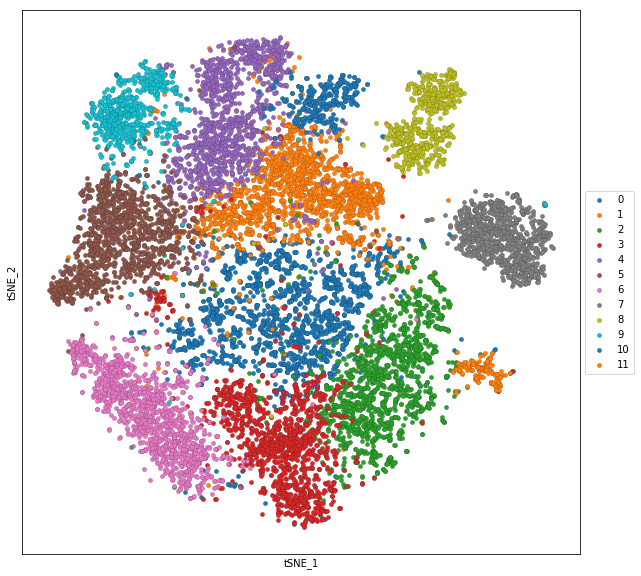

In [28]:
clusters = pd.read_csv('/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force/clusters.tsv', sep='\t', index_col=0)['res.0.6'].rename('cluster').to_frame()
tsne = pd.read_csv('/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force/tsne.tsv', sep='\t', index_col=0).join(clusters)
TSNEPlot(data=tsne, hue='cluster', palette=sns.color_palette(n_colors=12), figsize=(10, 10), lw=.1)

  * 0: 'L1º'
  * 1: 'MC'
  * 2: 'M1º'
  * 3: 'E1º'
  * 4: 'LC'
  * 5: 'EC'
  * 6: 'SP'
  * 7: 'TE'
  * 8: 'PC'
  * 9: 'U1'
  * 10: 'U2'
  * 11: 'U3'

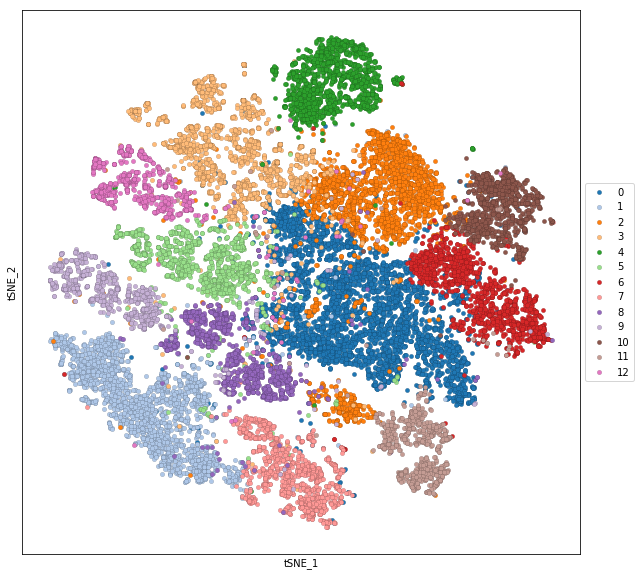

In [34]:
clusters = pd.read_csv('../output/scrnaseq-wf/scrnaseq_combine/clusters.tsv', sep='\t', index_col=0)['res.0.4'].rename('cluster').to_frame()
tsne = pd.read_csv('../output/scrnaseq-wf/scrnaseq_combine/tsne.tsv', sep='\t', index_col=0).join(clusters)
TSNEPlot(data=tsne, hue='cluster', palette=sns.color_palette('tab20', n_colors=13), figsize=(10, 10), lw=.1)

  * 0: 
  * 1: SP
  * 2: 
  * 3: 
  * 4: 
  * 5: 
  * 6: 
  * 7: 
  * 8: 
  * 9: 
  * 10: 
  * 11:
  * 12: 

In [4]:
with open('/home/fearjm/local_data_store/larval_gonad/output/paper_submission/fbgn2symbol.pkl', 'rb') as fh:
    fbgn2symbol = pickle.loads(fh.read())

with open('../config/literature_genes.yaml', 'rb') as fh:
    lit_genes = yaml.load(fh.read())

In [5]:
def plot(name, dir_name='../output/scrnaseq-wf/scrnaseq_combine', res='res.0.4'):
    clusters = pd.read_csv(Path(dir_name, 'clusters.tsv'), sep='\t', index_col=0)[res].rename('cluster').to_frame()
    tsne = pd.read_csv(Path(dir_name, 'tsne.tsv'), sep='\t', index_col=0).join(clusters)
    norm = pd.read_csv(Path(dir_name, 'normalized_read_counts.tsv'), sep='\t', index_col=0)
    
    values = lit_genes[name]
    dim = (int(np.ceil(len(values) / 4)), 4)
    dat = norm.reindex(values).T.reindex(tsne.index)
    dat2 = dat.rename_axis('cell_id').reset_index().melt(id_vars='cell_id', var_name='gene', value_name='norm').set_index('cell_id').join(clusters).assign(gene=lambda df: df.gene.map(fbgn2symbol))

    fig, axes = plt.subplots(*dim, figsize=(20, 20))
    for ax, fbgn in zip(axes.flat, values):
        tsne['flag'] = (dat[fbgn] > 0).values
        TSNEPlot(data=tsne, hue='flag', palette=['lightgray', 'k'], lw=0, ax=ax)
        ax.set_title(fbgn2symbol[fbgn])
        ax.legend_.remove()
        ax.set(xlabel='', ylabel='', aspect='equal')
    fig.suptitle(name, y=1, fontsize=18)
    plt.tight_layout()

    fig, axes = plt.subplots(*dim, figsize=(20, 20))
    for ax, fbgn in zip(axes.flat, values):
        tsne['flag'] = dat[fbgn].values
        TSNEPlot(data=tsne, hue='flag', palette=sns.color_palette('Purples'), lw=0, ax=ax, vmax=3, cbar=False)
        ax.set_title(fbgn2symbol[fbgn])
        ax.set(xlabel='', ylabel='', aspect='equal')
    fig.suptitle(name, y=1.1, fontsize=18)
    plt.tight_layout()

    g = sns.FacetGrid(dat2, col='gene', col_wrap=4, size=6)
    g.map(sns.violinplot, 'cluster', 'norm', scale='width', inner=None)
    g.set(ylim=(0, None))

## Gonia

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


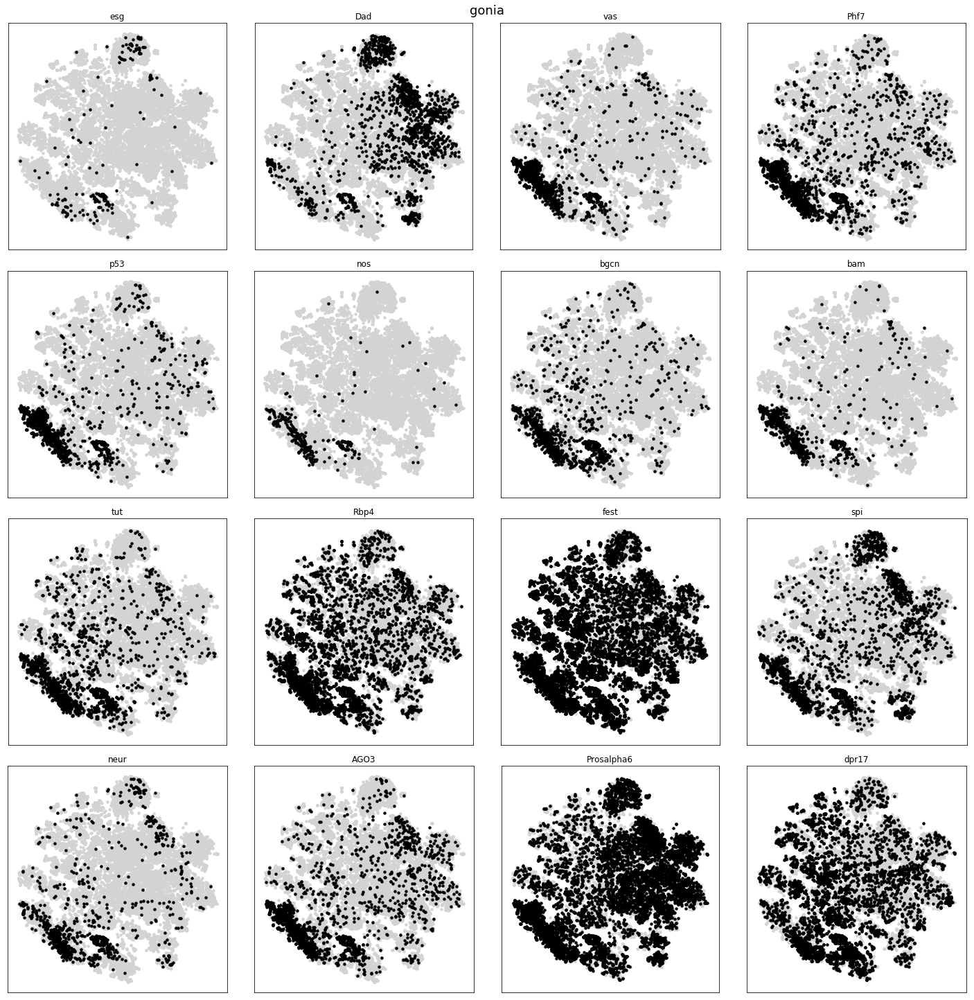

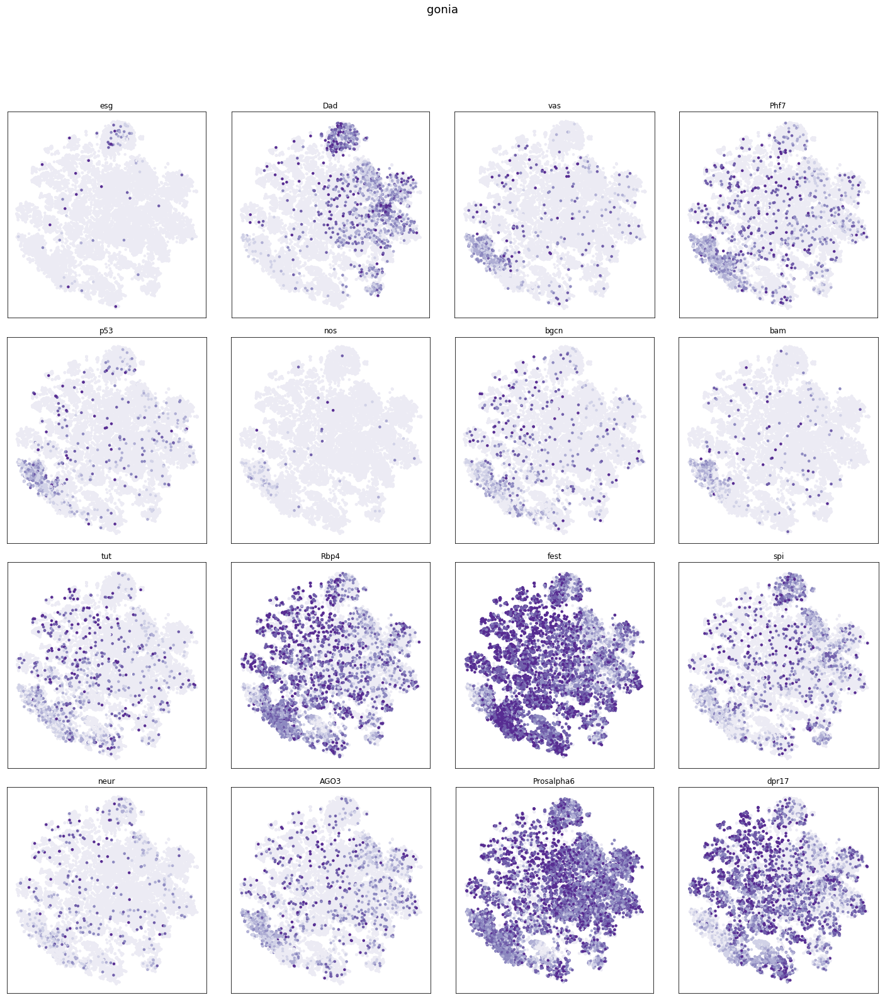

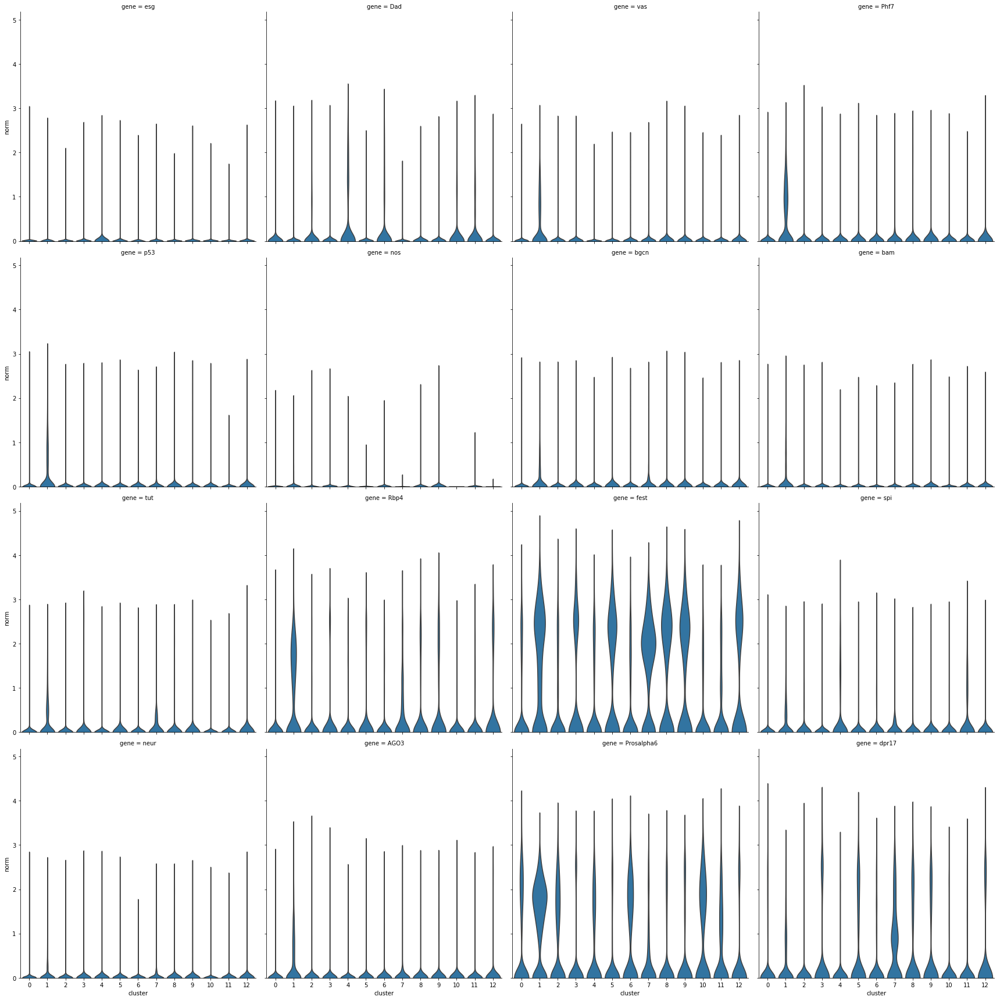

In [6]:
plot('gonia')

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


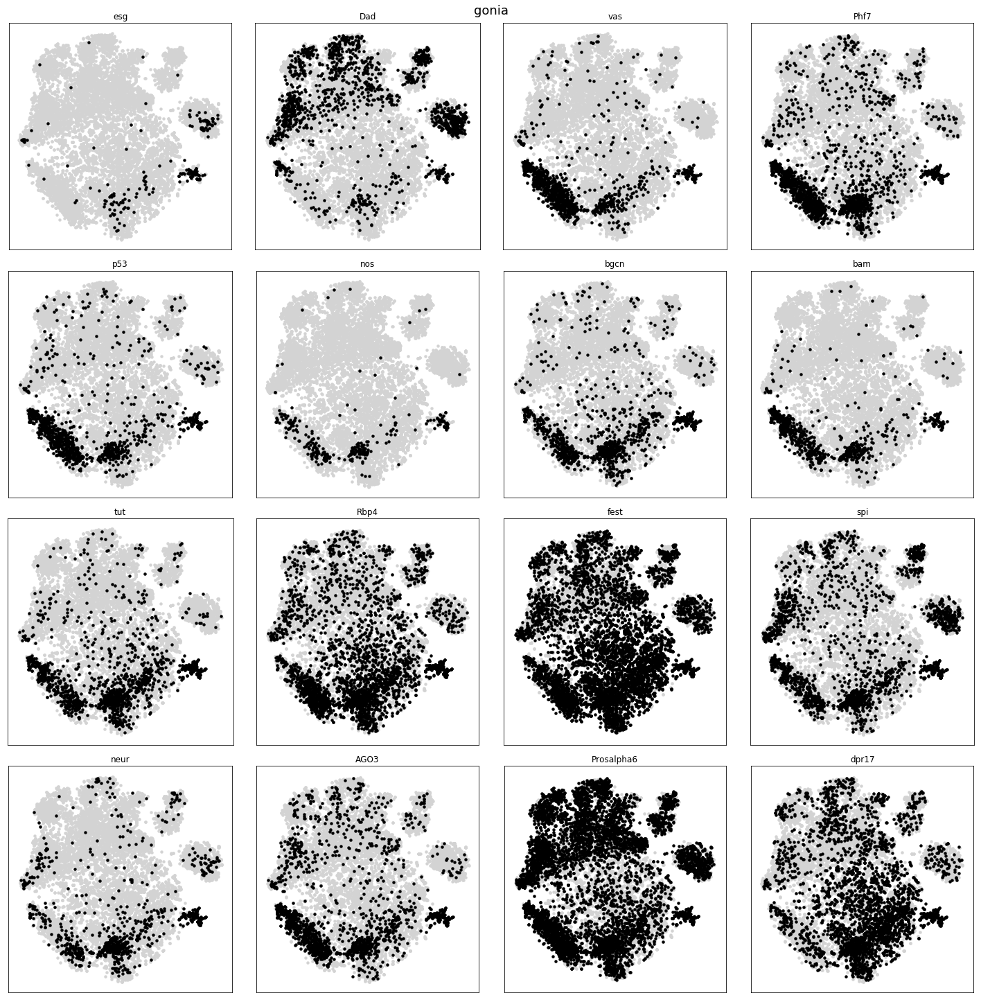

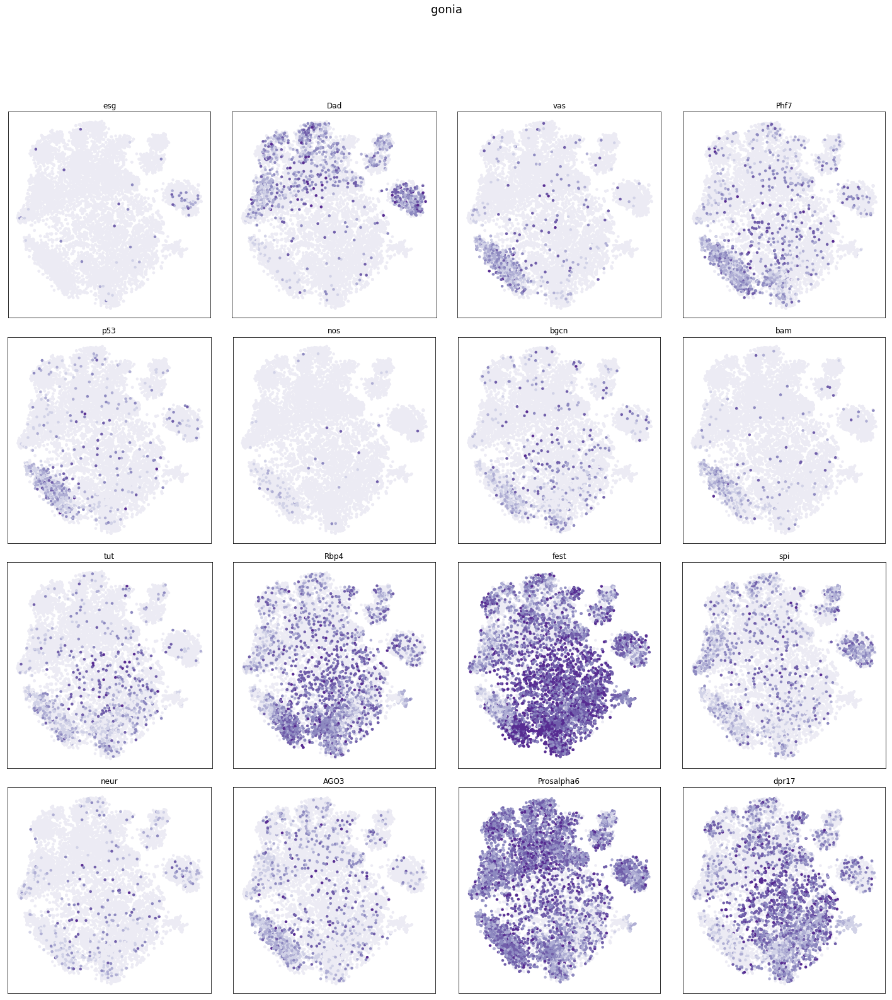

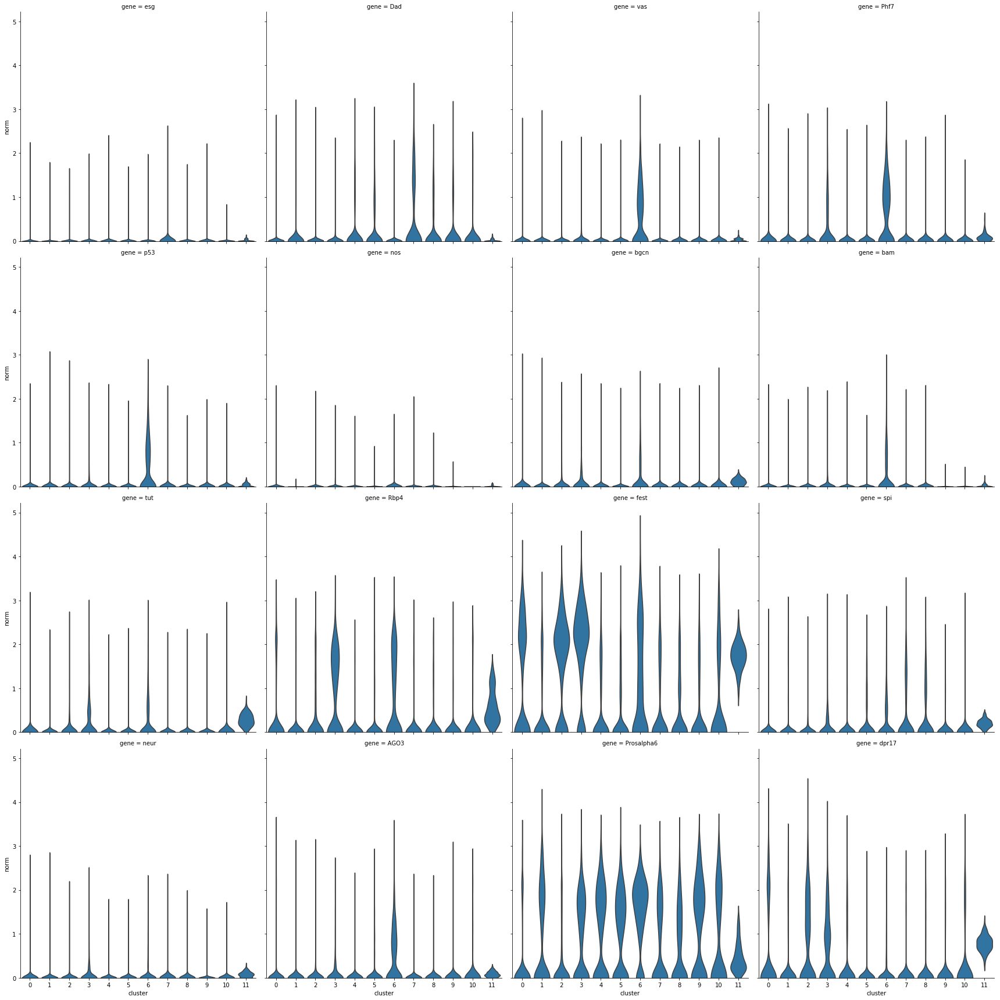

In [7]:
plot('gonia', '/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force', 'res.0.6')

## Spermatocytes

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


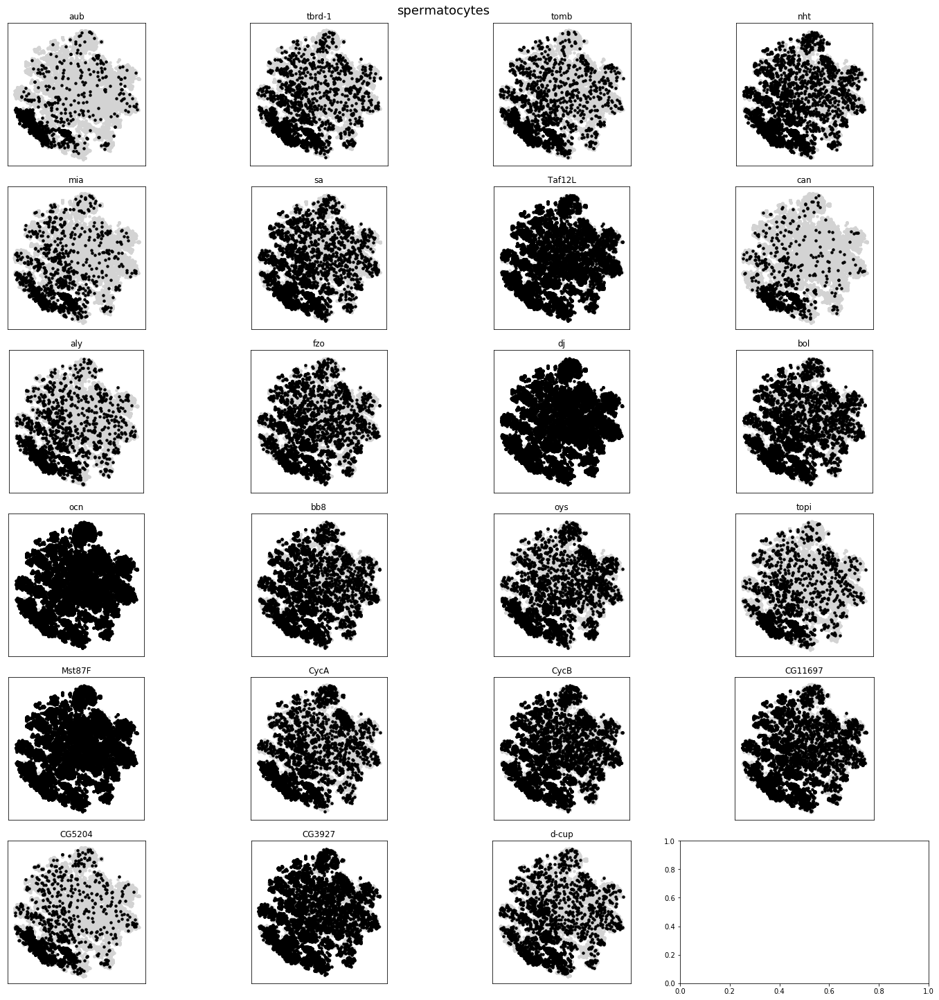

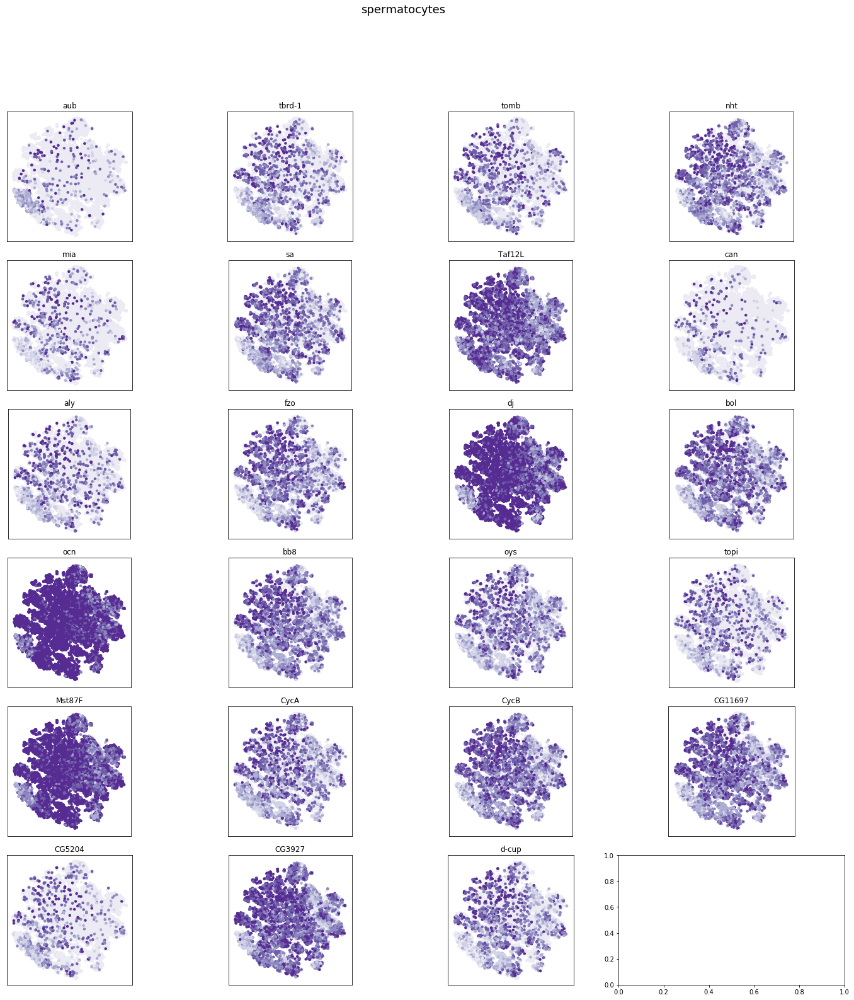

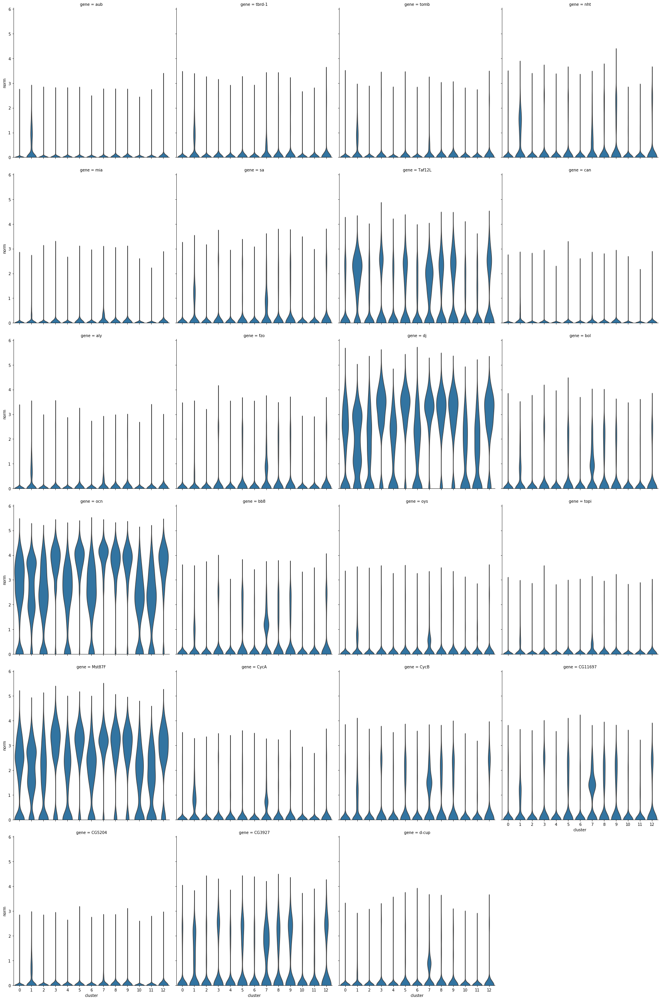

In [8]:
plot('spermatocytes')

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


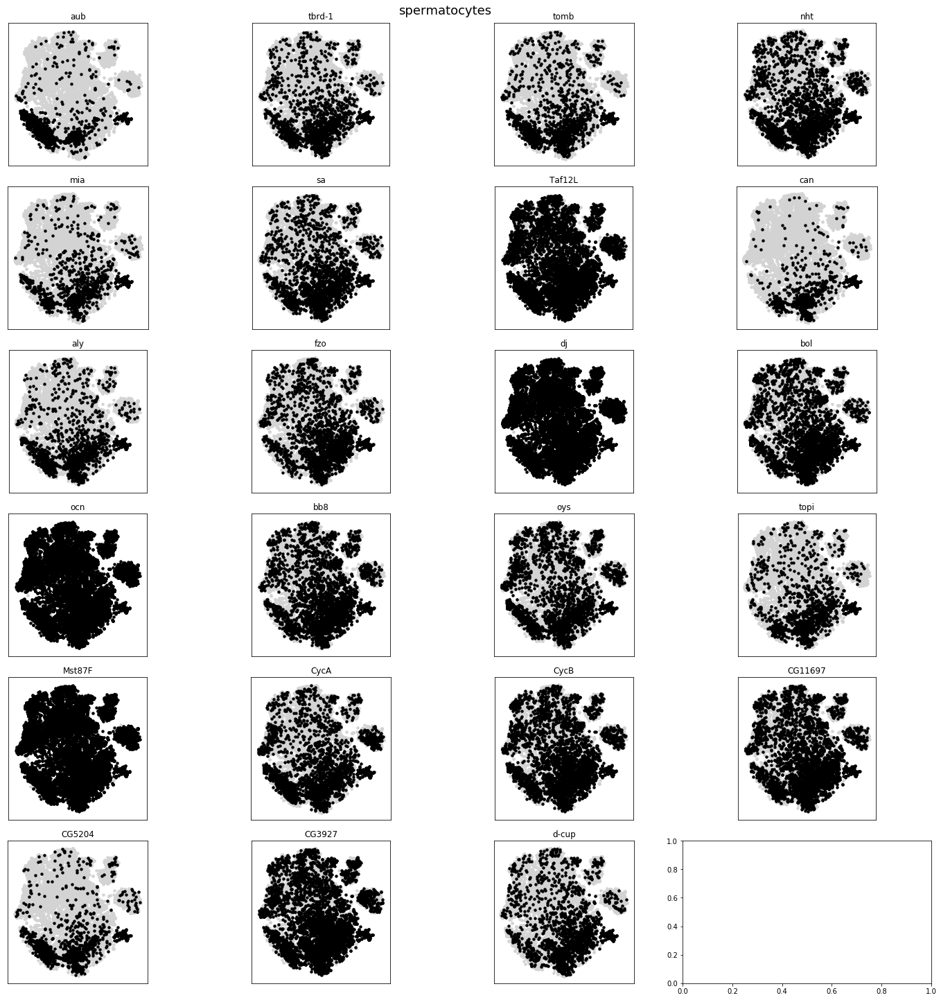

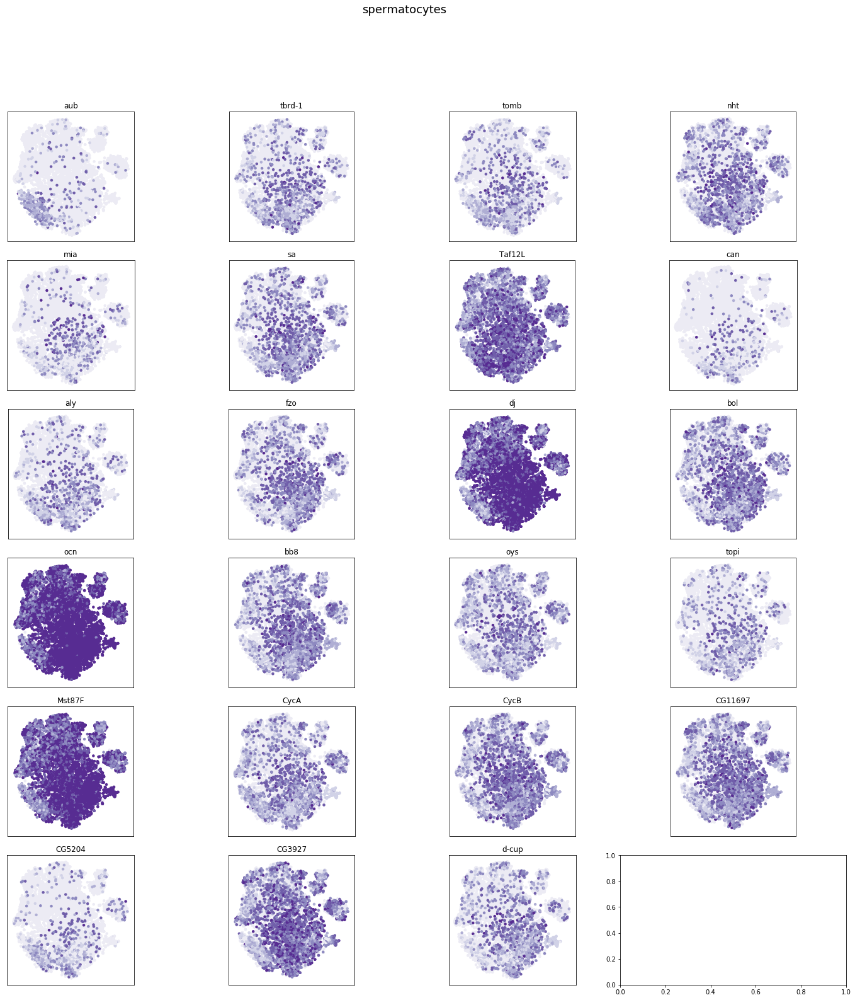

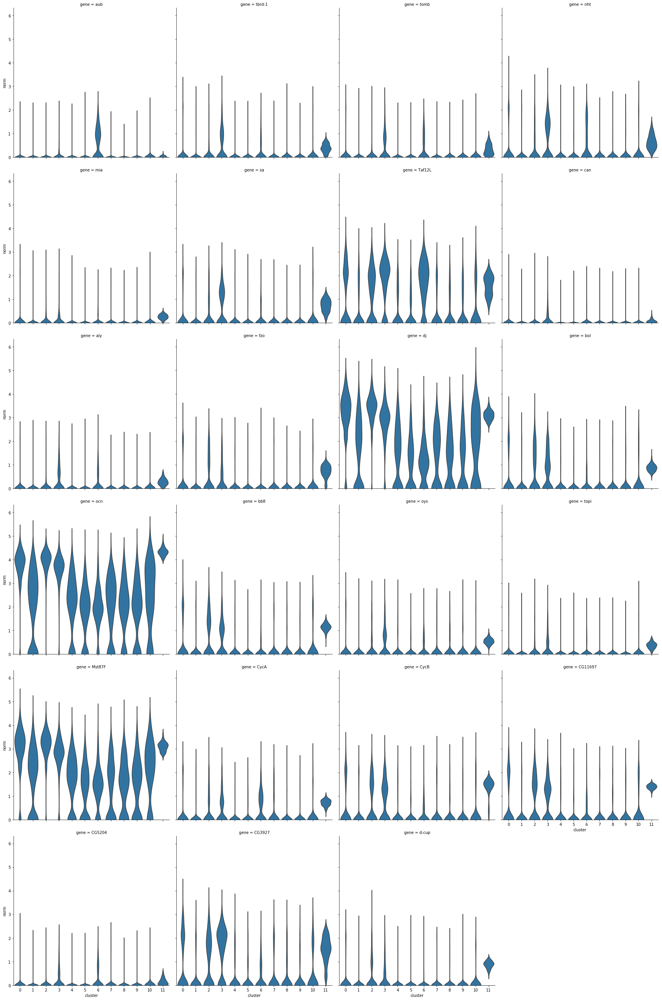

In [9]:
plot('spermatocytes', '/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force', 'res.0.6')

## CySC

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


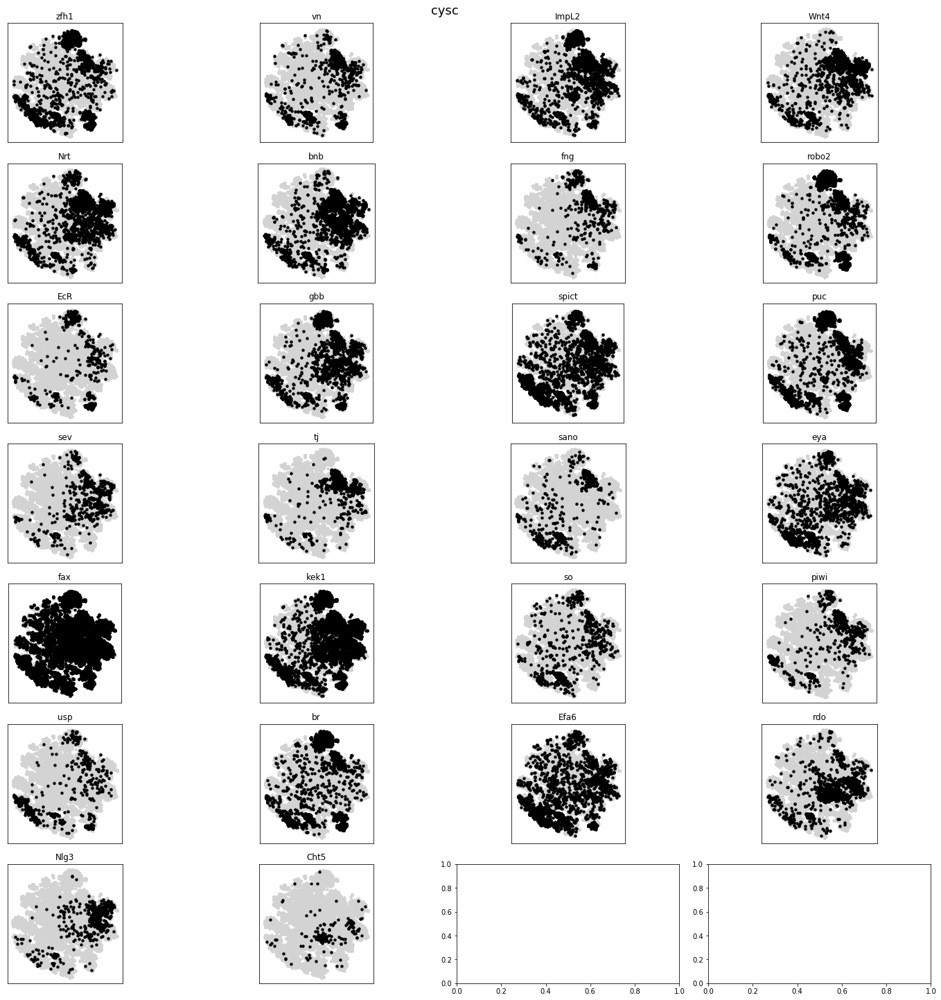

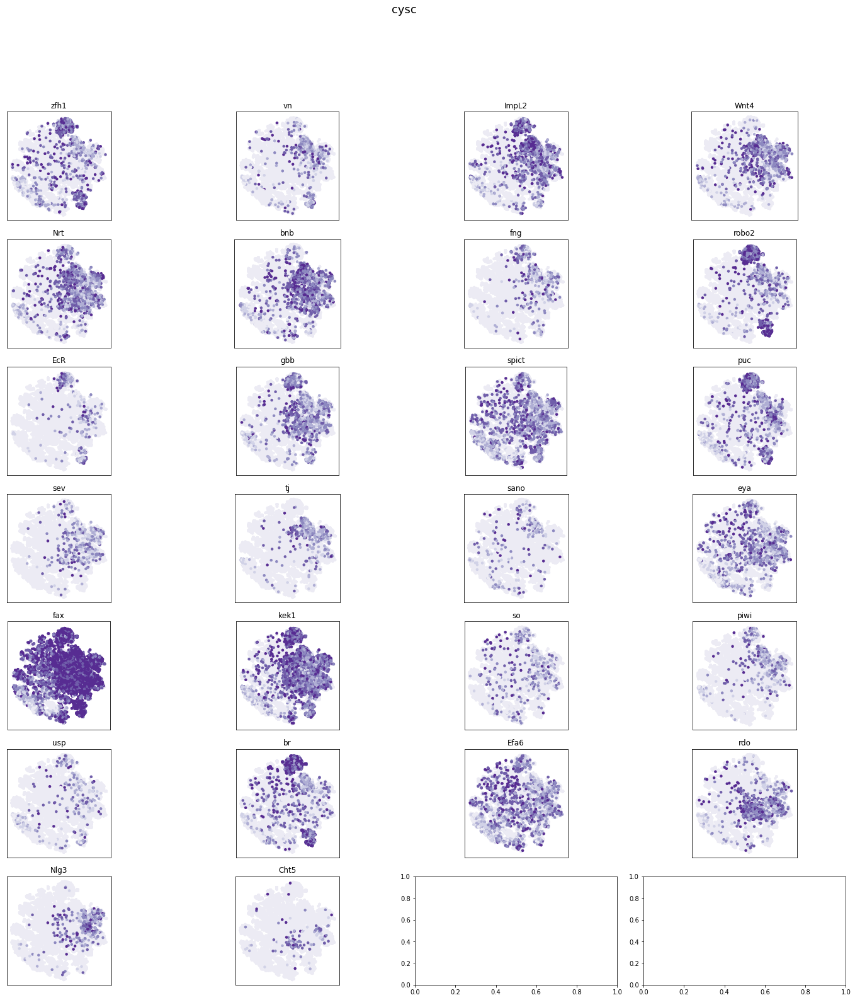

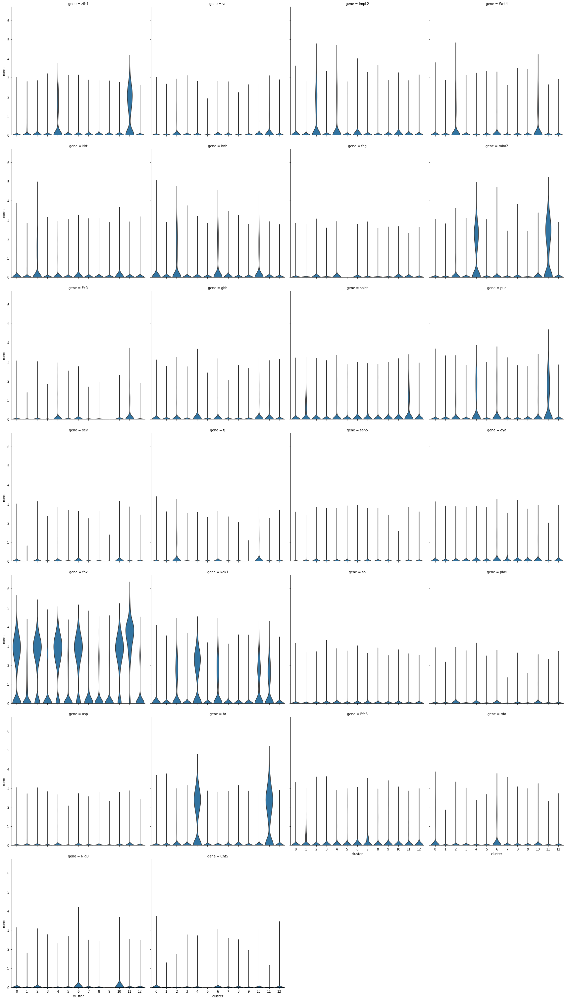

In [10]:
plot('cysc')

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


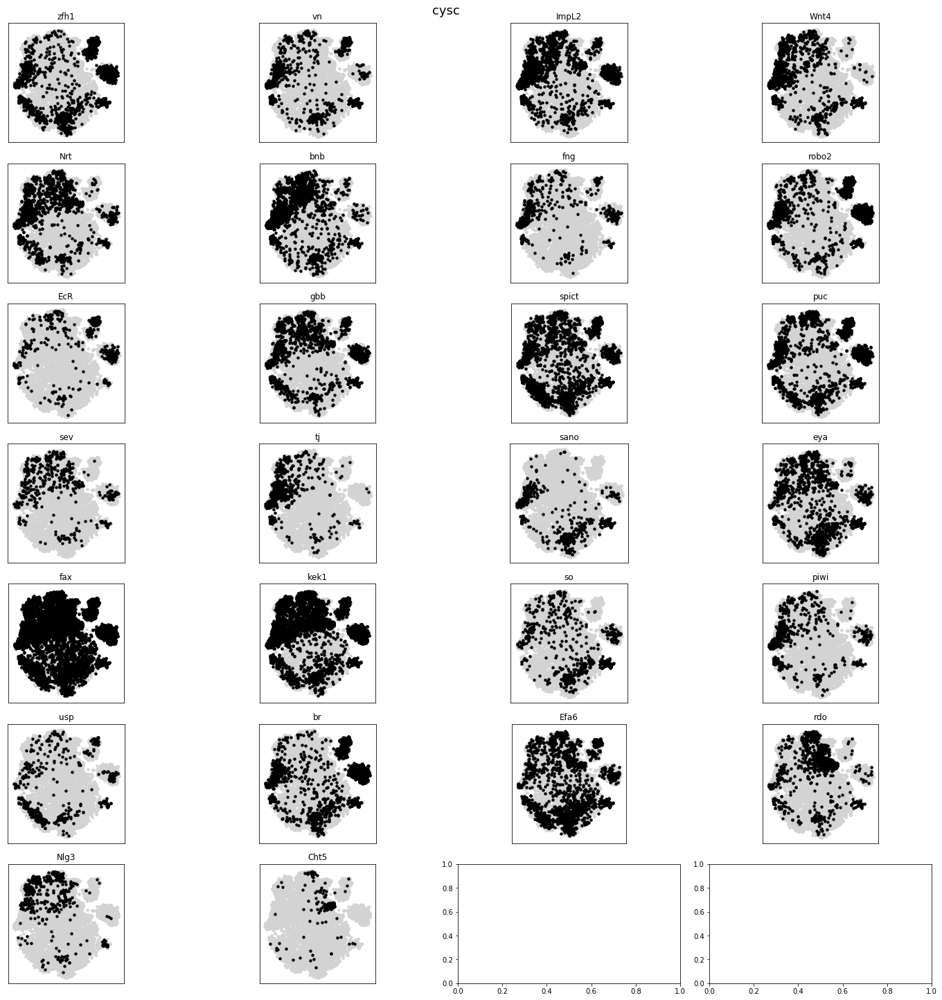

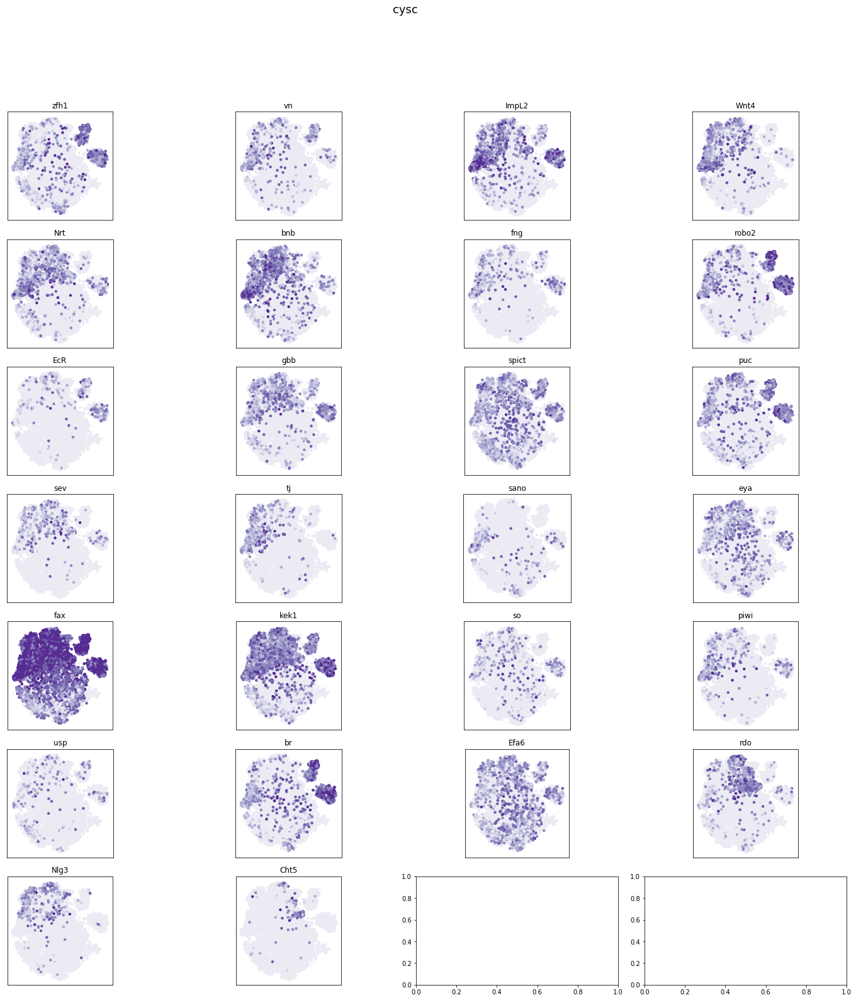

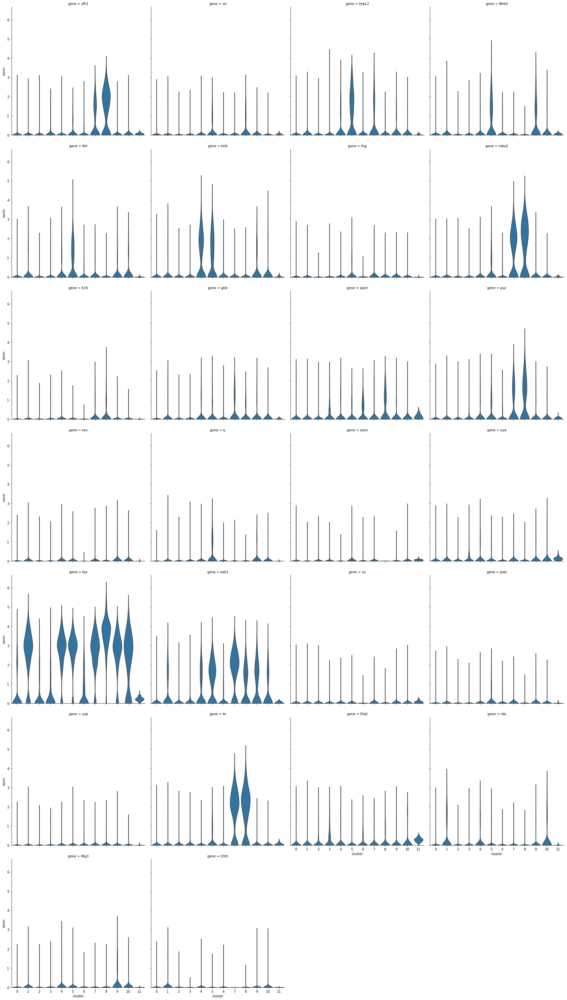

In [11]:
plot('cysc', '/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force', 'res.0.6')

## hub

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


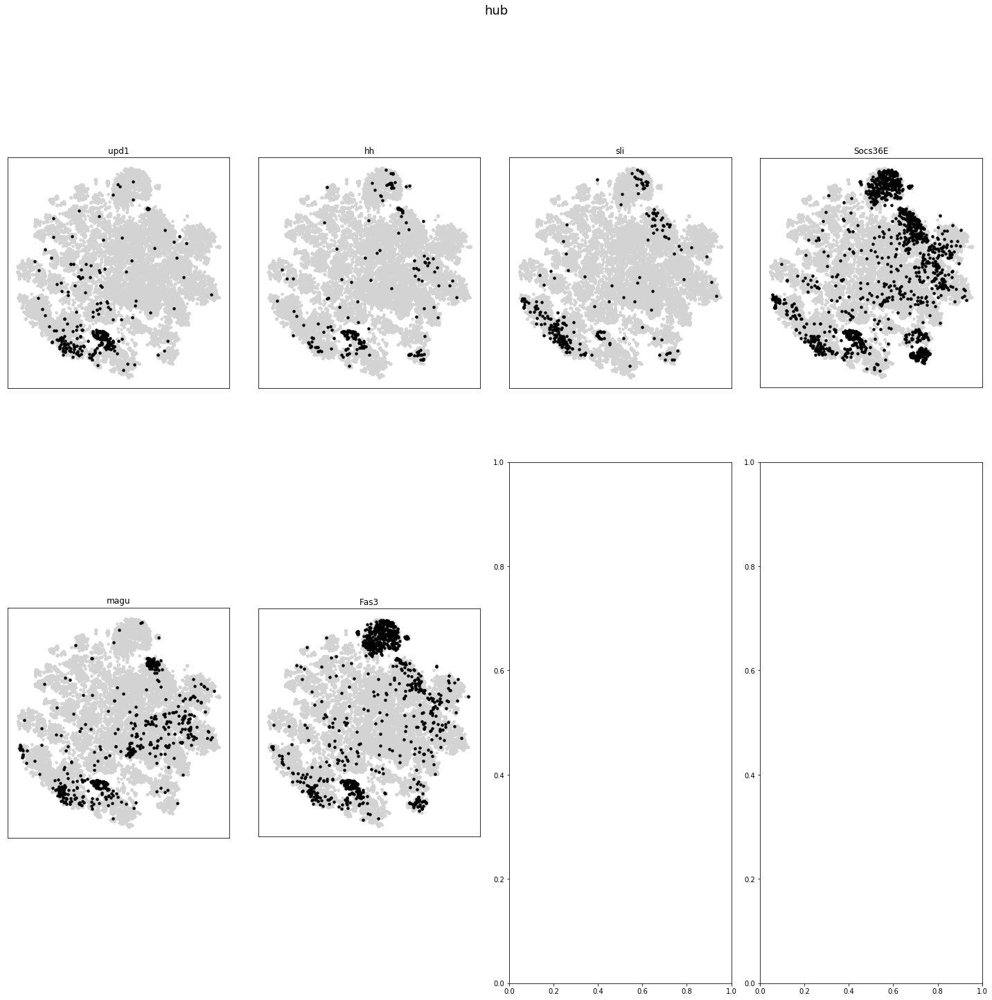

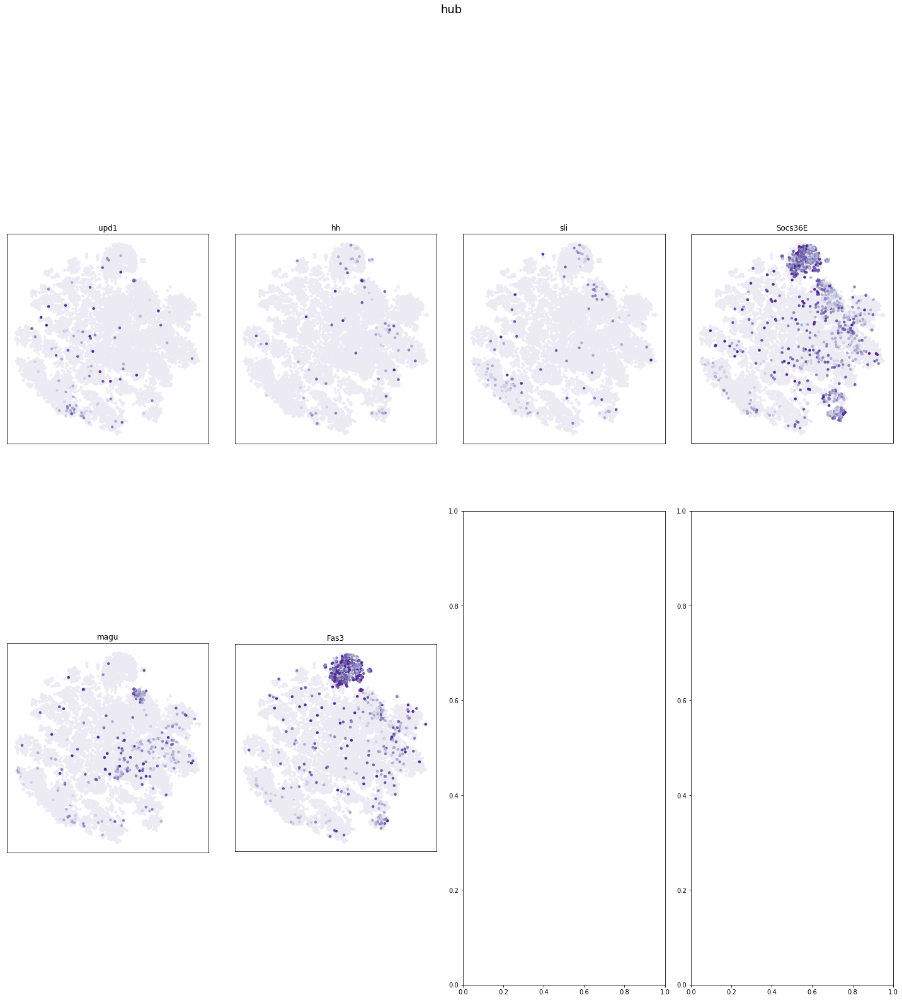

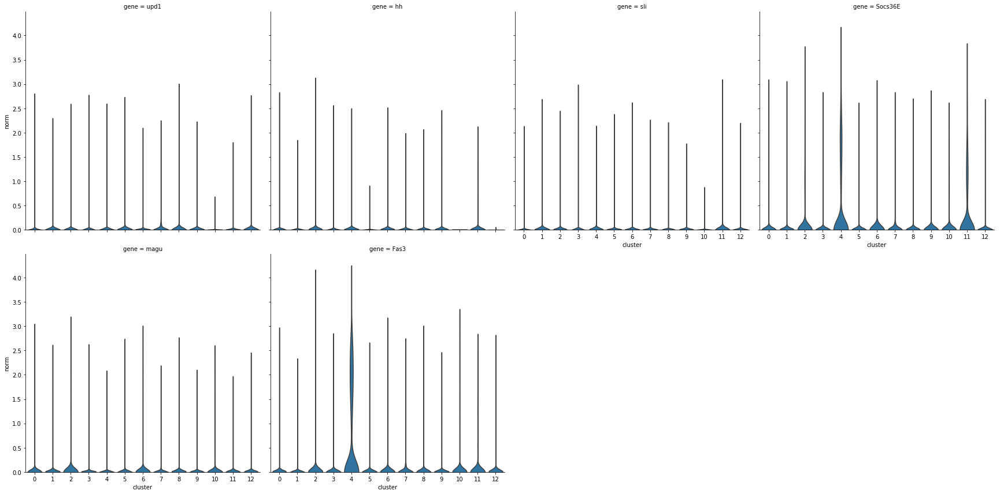

In [12]:
plot('hub')

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


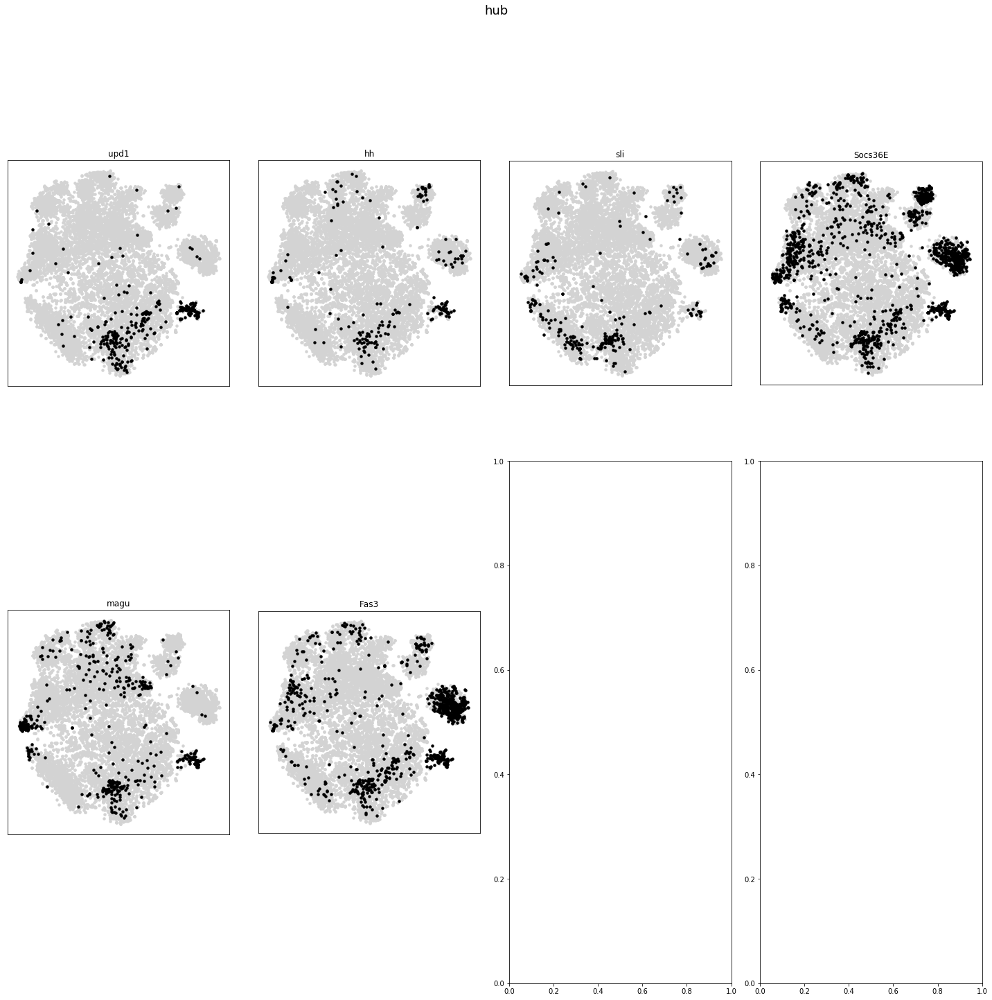

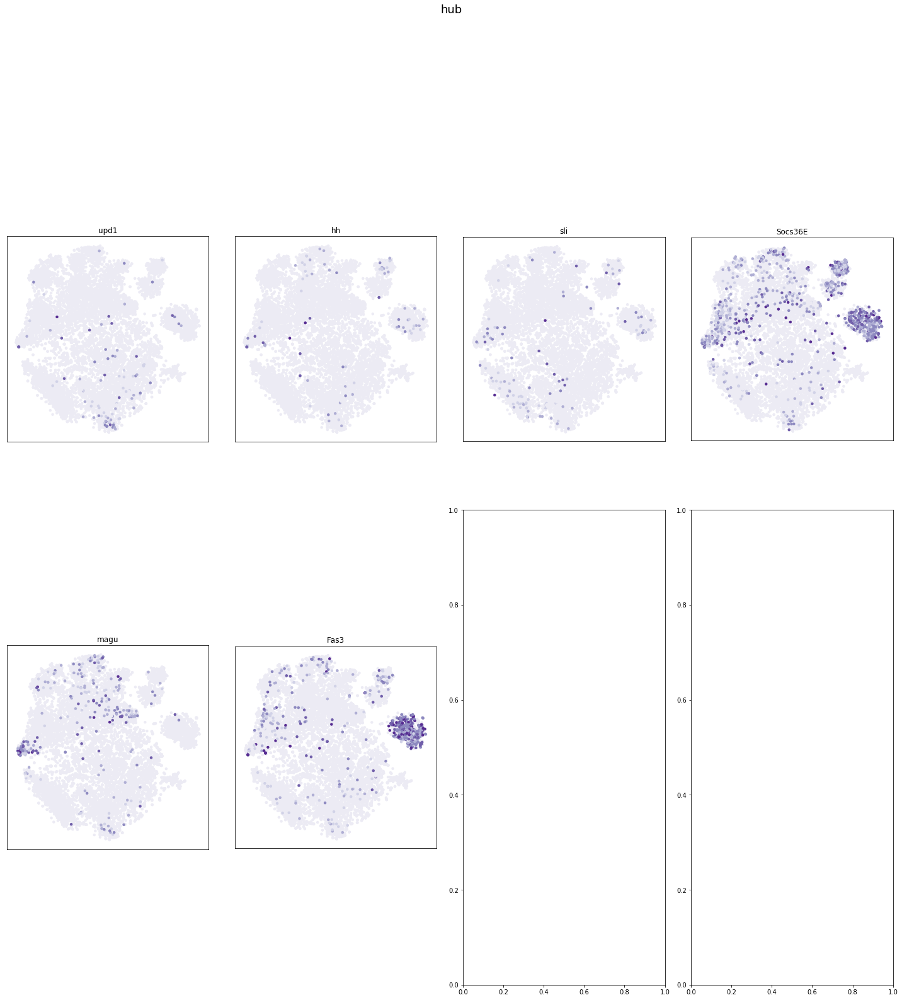

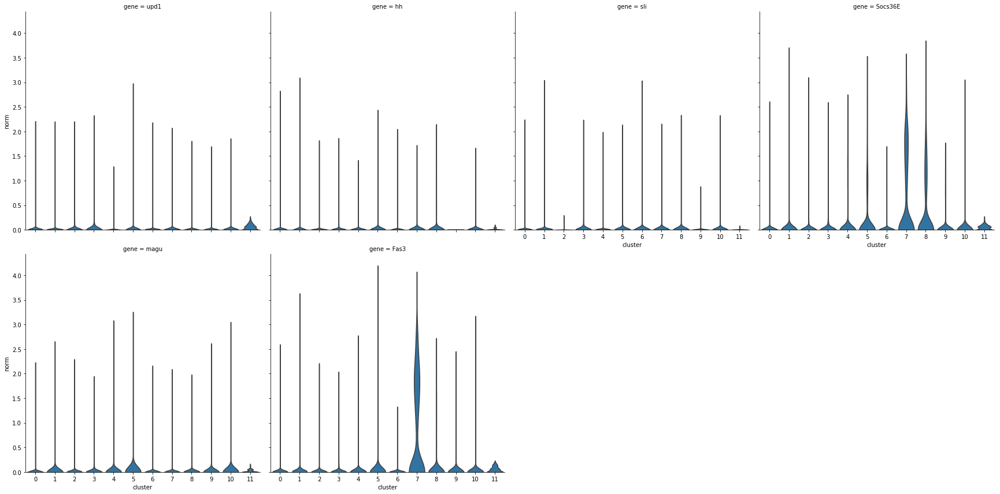

In [13]:
plot('hub', '/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force', 'res.0.6')

## TE

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


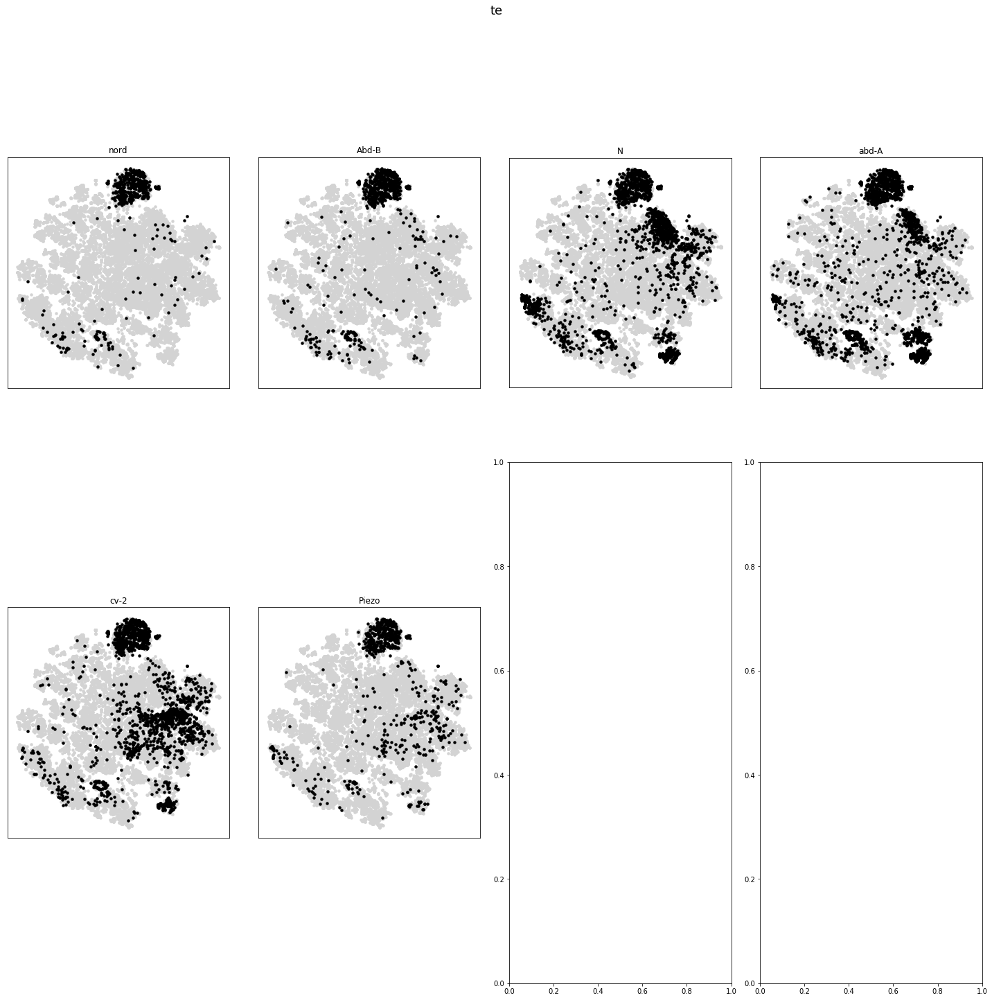

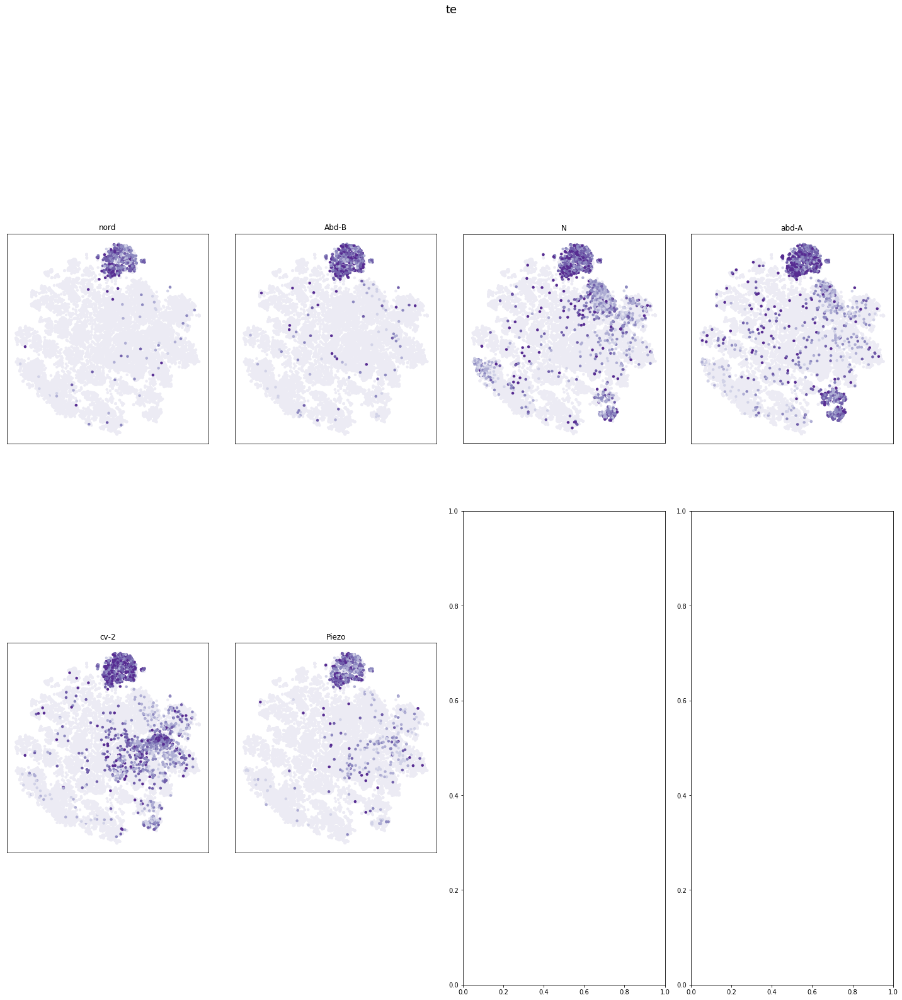

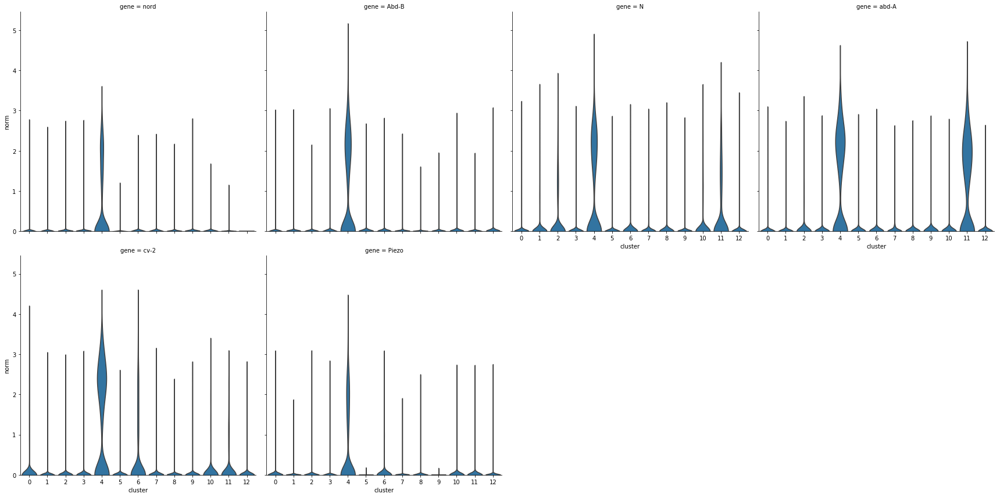

In [14]:
plot('te')

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


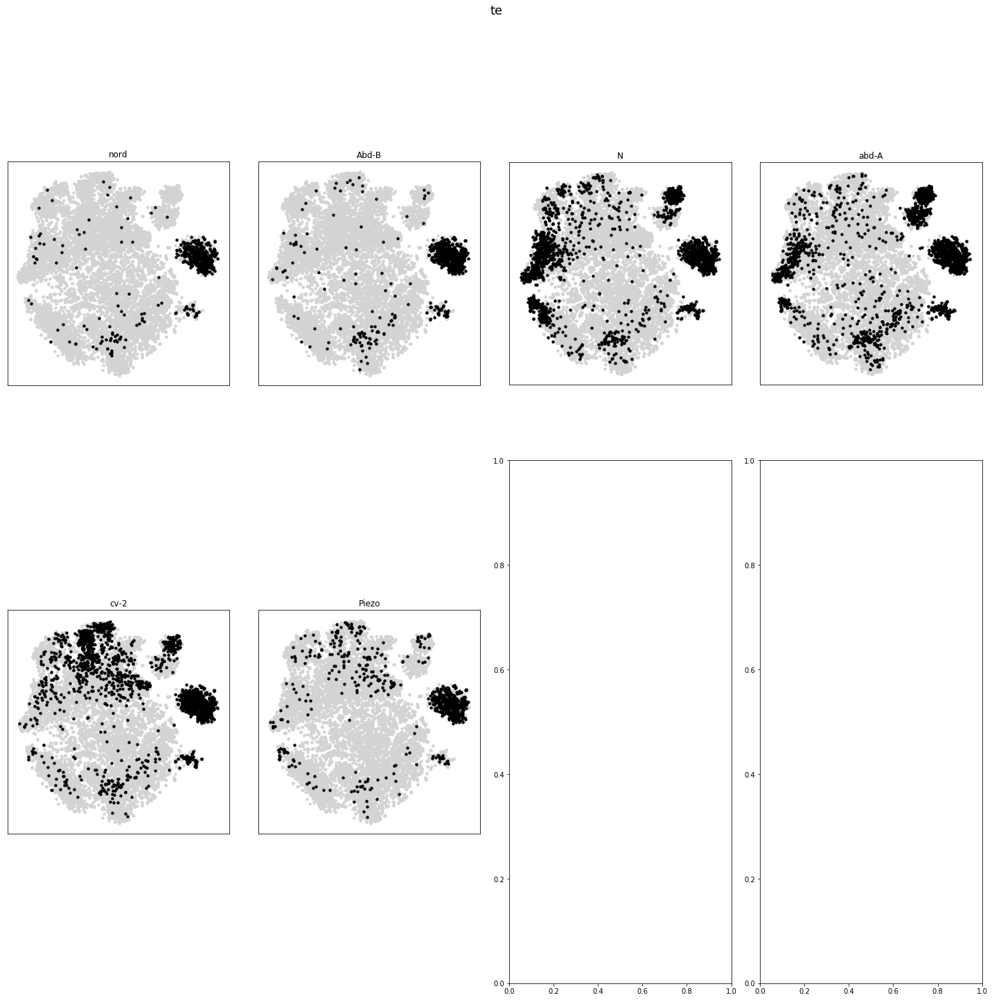

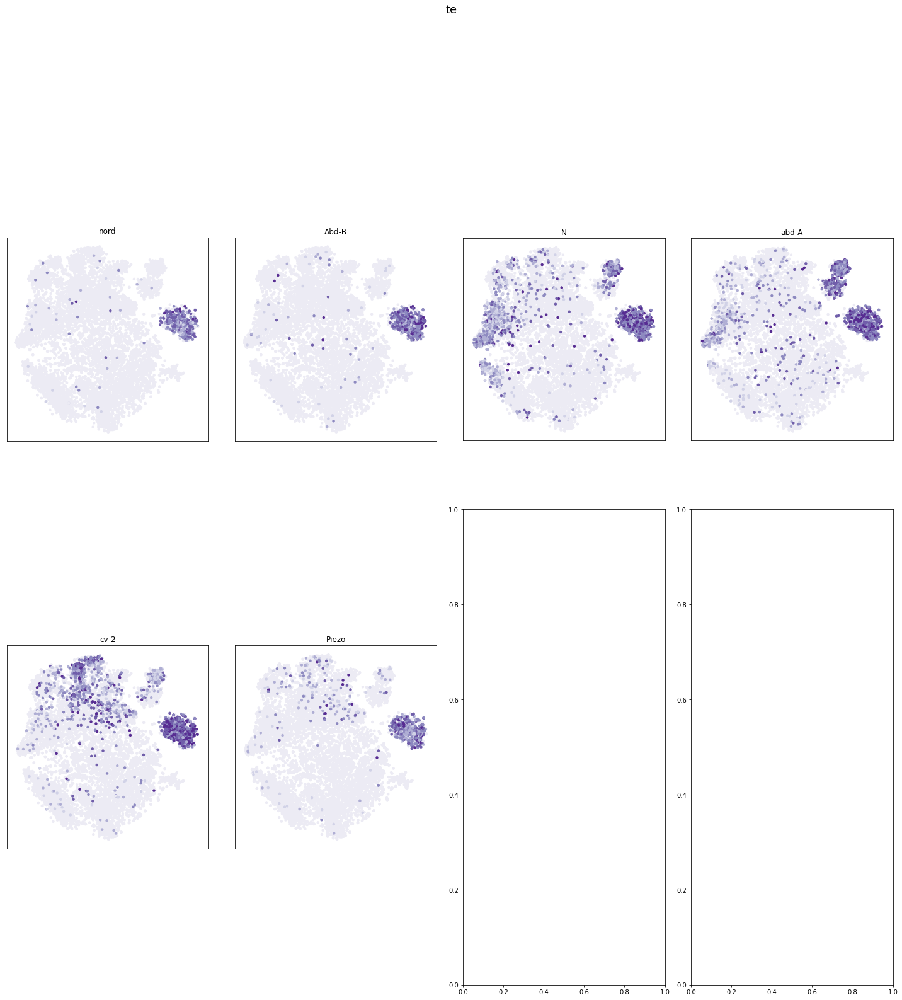

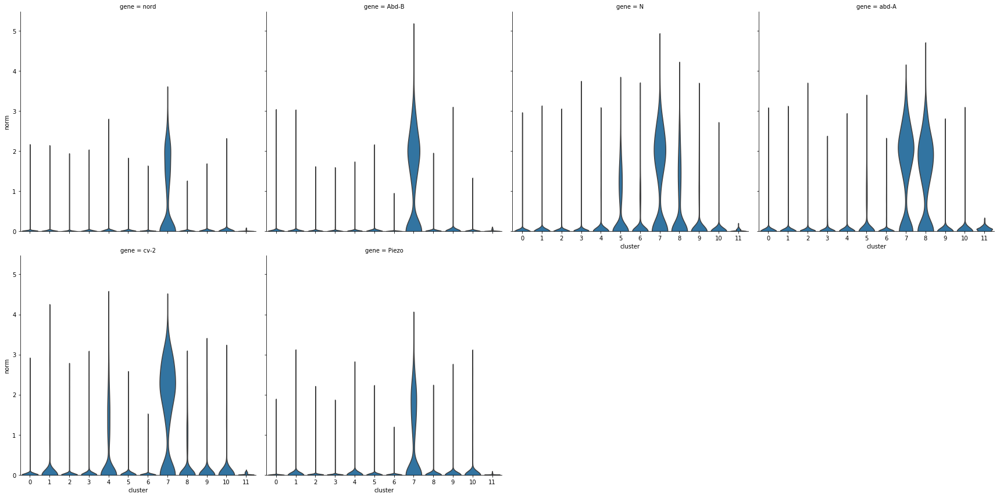

In [15]:
plot('te', '/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force', 'res.0.6')

## Pigment

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


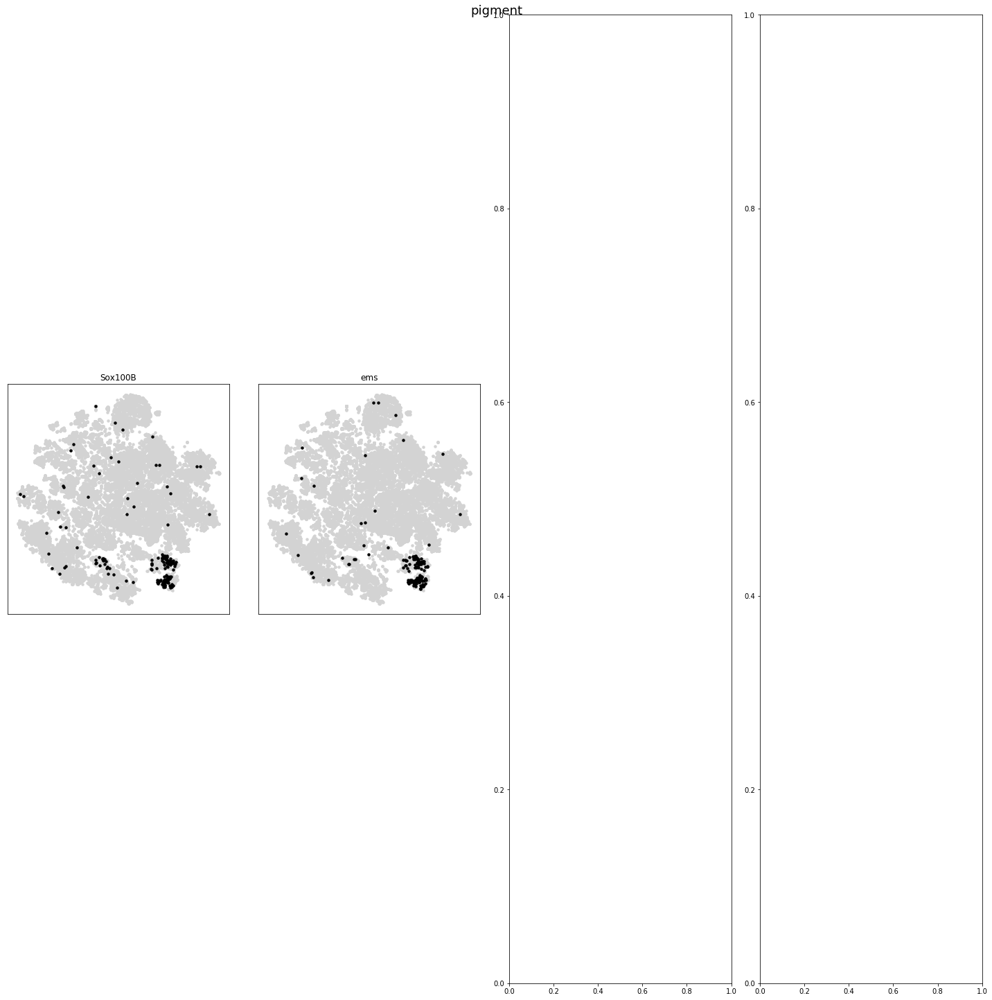

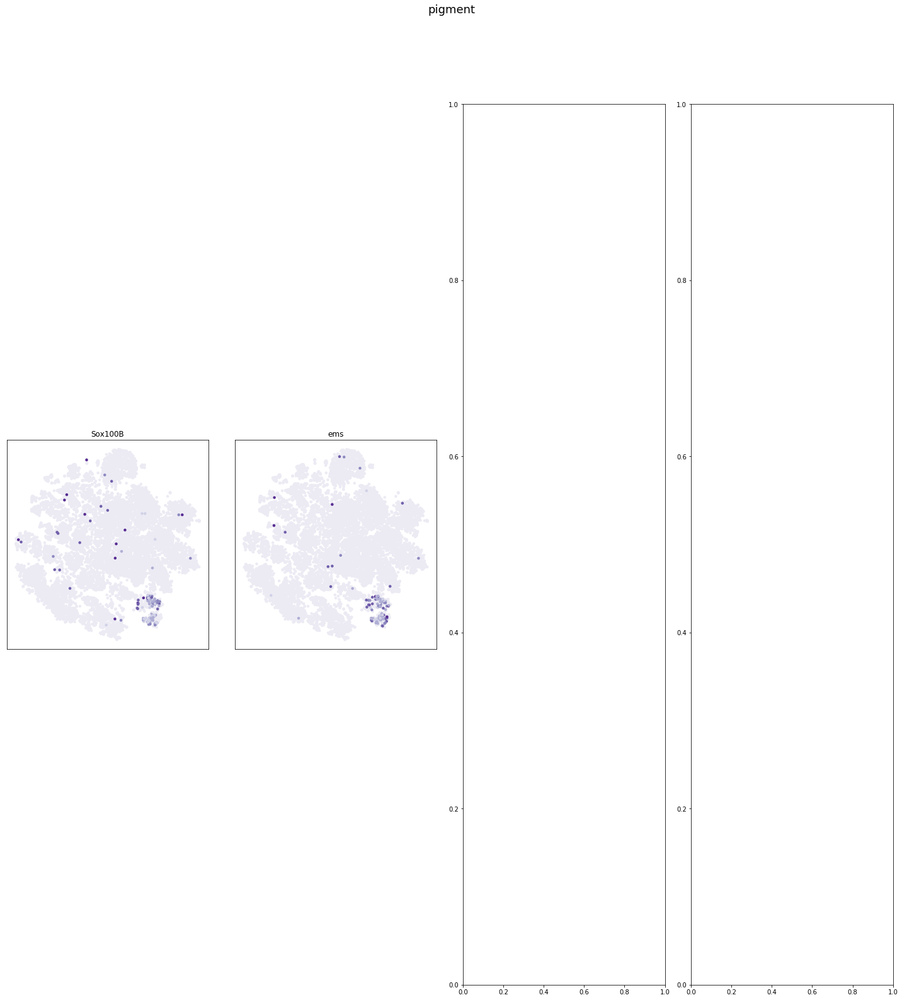

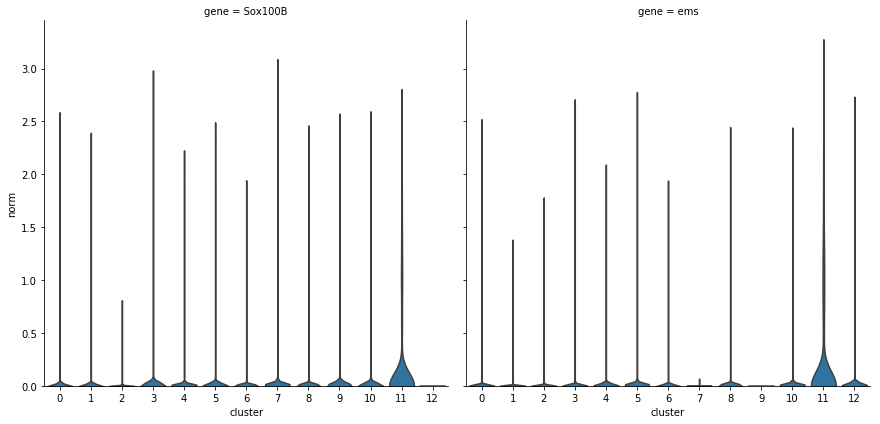

In [16]:
plot('pigment')

/home/fearjm/miniconda3/envs/larval_gonad/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


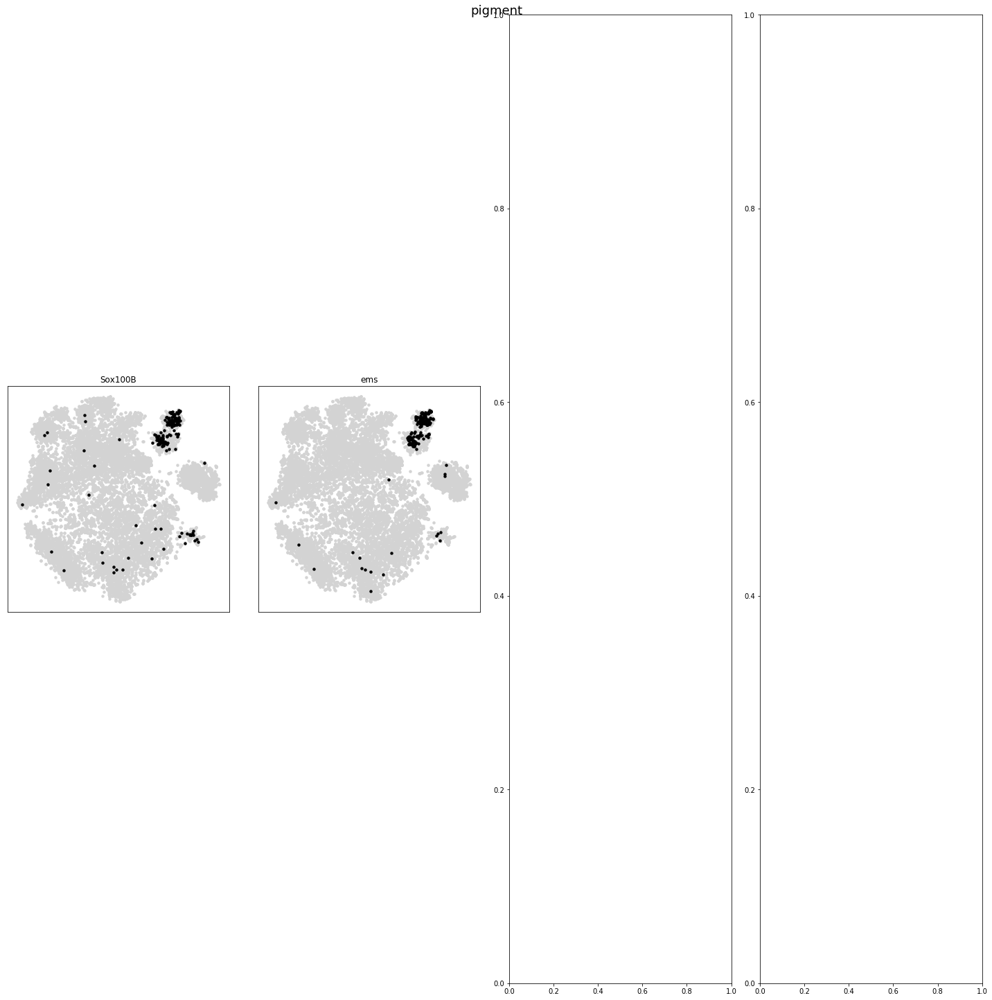

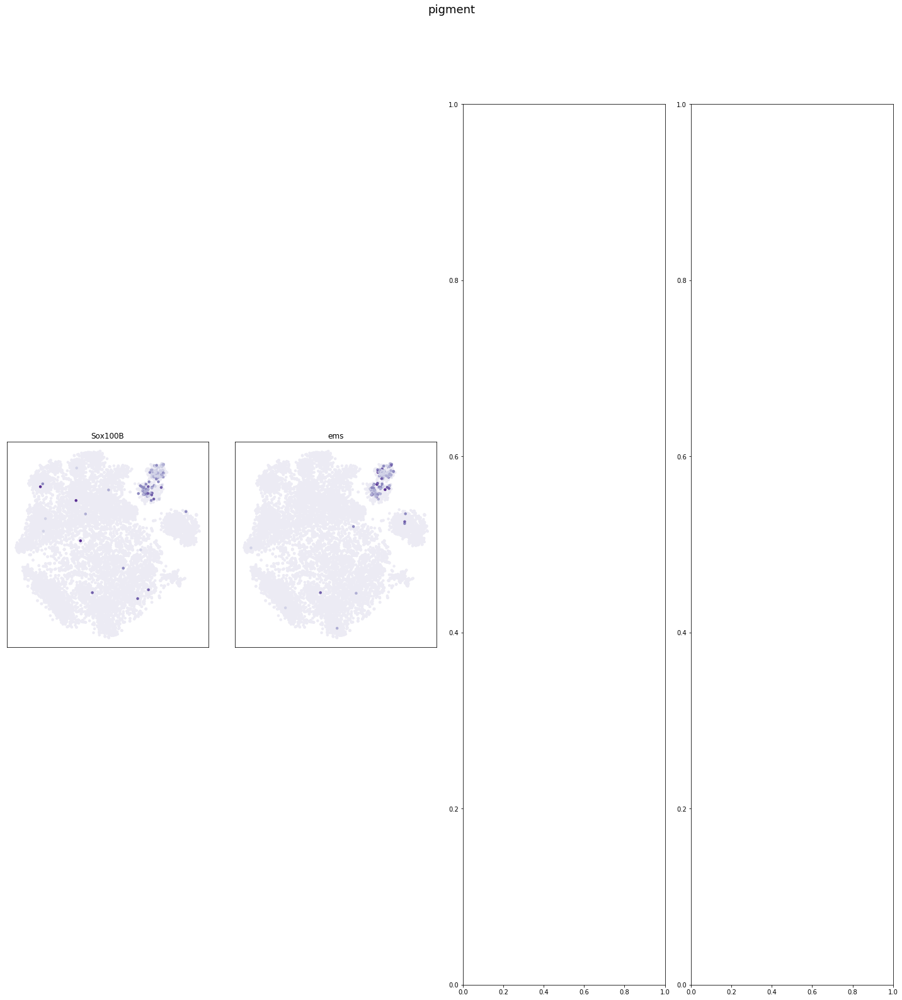

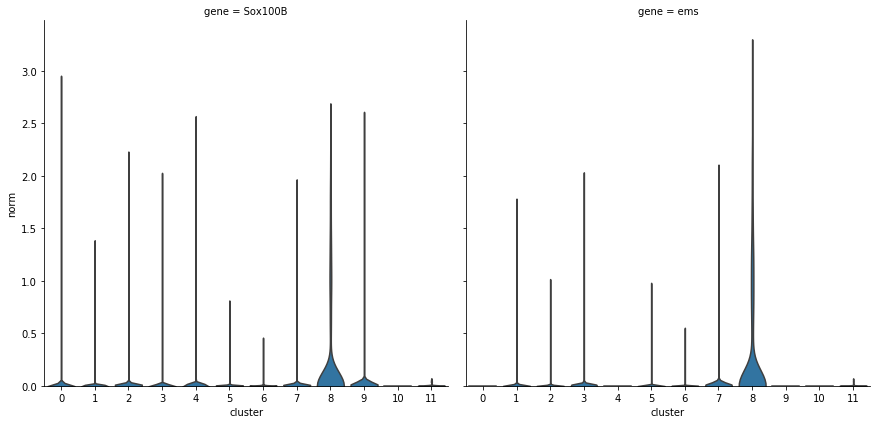

In [17]:
plot('pigment', '/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force', 'res.0.6')

## Comapre biomarkers

In [75]:
pd.options.display.max_rows = 200

### Gonia

In [23]:
v2 = pd.read_csv('/home/fearjm/local_data_store/larval_gonad/output/scrnaseq-wf/scrnaseq_combine_force/biomarkers_res.0.6.tsv', sep='\t', index_col=0).rename_axis('FBgn')
v3 = pd.read_csv('../output/scrnaseq-wf/scrnaseq_combine/biomarkers_res.0.4.tsv', sep='\t', index_col=0).rename_axis('FBgn')

In [111]:
v2_ = v2.query('cluster == "6" & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
v3_ = v3.query('cluster == "1" & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
_df = pd.merge(v2_['gene_symbol'].to_frame().drop_duplicates(), v3_['gene_symbol'].to_frame().drop_duplicates(), how='outer', left_index=True, right_index=True, suffixes=('_v2', '_v3')).reindex(lit_genes['gonia']).dropna(how='all')
display(_df)
print(tabulate.tabulate(_df, tablefmt="pipe", headers="keys"))

,gene_symbol_v2,gene_symbol_v3
FBgn,,
FBgn0283442,vas,vas
FBgn0031091,Phf7,Phf7
FBgn0039044,p53,p53
FBgn0000158,bam,NaN
FBgn0010258,Rbp4,Rbp4
FBgn0034435,fest,fest
FBgn0250816,AGO3,AGO3
FBgn0250843,Prosalpha6,Prosalpha6


| FBgn        | gene_symbol_v2   | gene_symbol_v3   |
|:------------|:-----------------|:-----------------|
| FBgn0283442 | vas              | vas              |
| FBgn0031091 | Phf7             | Phf7             |
| FBgn0039044 | p53              | p53              |
| FBgn0000158 | bam              | nan              |
| FBgn0010258 | Rbp4             | Rbp4             |
| FBgn0034435 | fest             | fest             |
| FBgn0250816 | AGO3             | AGO3             |
| FBgn0250843 | Prosalpha6       | Prosalpha6       |


### SpermatocyteS

In [112]:
v2_ = v2.query('cluster == ["0", "2", "3", "11"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
v3_ = v3.query('cluster == ["3", "5", "8", "9", "12"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
_df = pd.merge(v2_['gene_symbol'].to_frame().drop_duplicates(), v3_['gene_symbol'].to_frame().drop_duplicates(), how='outer', left_index=True, right_index=True, suffixes=('_v2', '_v3')).reindex(lit_genes['spermatocytes']).dropna(how='all')
display(_df)
print(tabulate.tabulate(_df, tablefmt="pipe", headers="keys"))

,gene_symbol_v2,gene_symbol_v3
FBgn,,
FBgn0039124,tbrd-1,NaN
FBgn0031715,tomb,NaN
FBgn0041103,nht,nht
FBgn0002842,sa,NaN
FBgn0031623,Taf12L,Taf12L
FBgn0011569,can,NaN
FBgn0004372,aly,NaN
FBgn0011596,fzo,fzo
FBgn0019828,dj,dj


| FBgn        | gene_symbol_v2   | gene_symbol_v3   |
|:------------|:-----------------|:-----------------|
| FBgn0039124 | tbrd-1           | nan              |
| FBgn0031715 | tomb             | nan              |
| FBgn0041103 | nht              | nht              |
| FBgn0002842 | sa               | nan              |
| FBgn0031623 | Taf12L           | Taf12L           |
| FBgn0011569 | can              | nan              |
| FBgn0004372 | aly              | nan              |
| FBgn0011596 | fzo              | fzo              |
| FBgn0019828 | dj               | dj               |
| FBgn0011206 | bol              | bol              |
| FBgn0041102 | ocn              | ocn              |
| FBgn0039071 | bb8              | bb8              |
| FBgn0033476 | oys              | nan              |
| FBgn0037751 | topi             | nan              |
| FBgn0002862 | Mst87F           | Mst87F           |
| FBgn0000405 | CycB             | CycB             |
| FBgn0030313 | CG11697     

### CySC

In [113]:
v2_ = v2.query('cluster == ["1", "4", "5", "9", "10"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
v3_ = v3.query('cluster == ["0", "2", "6", "10"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
_df = pd.merge(v2_['gene_symbol'].to_frame().drop_duplicates(), v3_['gene_symbol'].to_frame().drop_duplicates(), how='outer', left_index=True, right_index=True, suffixes=('_v2', '_v3')).reindex(lit_genes['cysc']).dropna(how='all')
display(_df)
print(tabulate.tabulate(_df, tablefmt="pipe", headers="keys"))

,gene_symbol_v2,gene_symbol_v3
FBgn,,
FBgn0003984,vn,vn
FBgn0001257,ImpL2,ImpL2
FBgn0010453,Wnt4,Wnt4
FBgn0004108,Nrt,Nrt
FBgn0001090,bnb,bnb
FBgn0243512,NaN,puc
FBgn0000964,tj,tj
FBgn0014163,fax,fax
FBgn0015399,kek1,kek1


| FBgn        | gene_symbol_v2   | gene_symbol_v3   |
|:------------|:-----------------|:-----------------|
| FBgn0003984 | vn               | vn               |
| FBgn0001257 | ImpL2            | ImpL2            |
| FBgn0010453 | Wnt4             | Wnt4             |
| FBgn0004108 | Nrt              | Nrt              |
| FBgn0001090 | bnb              | bnb              |
| FBgn0243512 | nan              | puc              |
| FBgn0000964 | tj               | tj               |
| FBgn0014163 | fax              | fax              |
| FBgn0015399 | kek1             | kek1             |
| FBgn0004872 | piwi             | nan              |
| FBgn0243486 | rdo              | rdo              |
| FBgn0083963 | Nlg3             | Nlg3             |


### TE

In [114]:
v2_ = v2.query('cluster == ["7"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
v3_ = v3.query('cluster == ["4"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
_df = pd.merge(v2_['gene_symbol'].to_frame().drop_duplicates(), v3_['gene_symbol'].to_frame().drop_duplicates(), how='outer', left_index=True, right_index=True, suffixes=('_v2', '_v3')).reindex(lit_genes['te']).dropna(how='all')
display(_df)
print(tabulate.tabulate(_df, tablefmt="pipe", headers="keys"))

,gene_symbol_v2,gene_symbol_v3
FBgn,,
FBgn0050418,nord,nord
FBgn0000015,Abd-B,Abd-B
FBgn0004647,N,N
FBgn0000014,abd-A,abd-A
FBgn0000395,cv-2,cv-2
FBgn0264953,Piezo,Piezo


| FBgn        | gene_symbol_v2   | gene_symbol_v3   |
|:------------|:-----------------|:-----------------|
| FBgn0050418 | nord             | nord             |
| FBgn0000015 | Abd-B            | Abd-B            |
| FBgn0004647 | N                | N                |
| FBgn0000014 | abd-A            | abd-A            |
| FBgn0000395 | cv-2             | cv-2             |
| FBgn0264953 | Piezo            | Piezo            |


### Pigment

In [115]:
v2_ = v2.query('cluster == ["8"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
v3_ = v3.query('cluster == ["11"] & p_val_adj <= .001').sort_values('avg_logFC', ascending=False)
_df = pd.merge(v2_['gene_symbol'].to_frame().drop_duplicates(), v3_['gene_symbol'].to_frame().drop_duplicates(), how='outer', left_index=True, right_index=True, suffixes=('_v2', '_v3')).reindex(lit_genes['pigment']).dropna(how='all')
display(_df)
print(tabulate.tabulate(_df, tablefmt="pipe", headers="keys"))

,gene_symbol_v2,gene_symbol_v3
FBgn,,
FBgn0024288,Sox100B,Sox100B
FBgn0000576,ems,ems


| FBgn        | gene_symbol_v2   | gene_symbol_v3   |
|:------------|:-----------------|:-----------------|
| FBgn0024288 | Sox100B          | Sox100B          |
| FBgn0000576 | ems              | ems              |
